In [1]:
import os
import shutil
import zipfile
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
ROOT_DIR = "data"
NEW_ROOT_DIR = "sampled_data"
RANDOM_STATE = 110

# Load data
train_data = pd.read_csv(os.path.join(ROOT_DIR, "train.csv"))
train_data

,Wip Line_Dam,Process Desc._Dam,Equipment_Dam,Model.Suffix_Dam,Workorder_Dam,Insp. Seq No._Dam,Insp Judge Code_Dam,CURE END POSITION X Collect Result_Dam,CURE END POSITION X Unit Time_Dam,CURE END POSITION X Judge Value_Dam,...,Production Qty Collect Result_Fill2,Production Qty Unit Time_Fill2,Production Qty Judge Value_Fill2,Receip No Collect Result_Fill2,Receip No Unit Time_Fill2,Receip No Judge Value_Fill2,WorkMode Collect Result_Fill2,WorkMode Unit Time_Fill2,WorkMode Judge Value_Fill2,target
0,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334505,4F1XA938-1,1,OK,240.0,NaN,NaN,...,7,NaN,NaN,127,NaN,NaN,1,NaN,NaN,Normal
1,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334505,3KPM0016-2,1,OK,240.0,NaN,NaN,...,185,NaN,NaN,1,NaN,NaN,0,NaN,NaN,Normal
2,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,4E1X9167-1,1,OK,1000.0,NaN,NaN,...,10,NaN,NaN,73,NaN,NaN,1,NaN,NaN,Normal
3,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,3K1X0057-1,1,OK,1000.0,NaN,NaN,...,268,NaN,NaN,1,NaN,NaN,0,NaN,NaN,Normal
4,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,3HPM0007-1,1,OK,240.0,NaN,NaN,...,121,NaN,NaN,1,NaN,NaN,0,NaN,NaN,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40501,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,3J1XF434-2,1,OK,240.0,NaN,NaN,...,318,NaN,NaN,1,NaN,NaN,0,NaN,NaN,Normal
40502,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,4E1XC796-1,1,OK,1000.0,NaN,NaN,...,14,NaN,NaN,197,NaN,NaN,1,NaN,NaN,Normal
40503,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,4C1XD438-1,1,OK,240.0,NaN,NaN,...,1,NaN,NaN,27,NaN,NaN,1,NaN,NaN,Normal
40504,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,3I1XA258-1,1,OK,1000.0,NaN,NaN,...,117,NaN,NaN,1,NaN,NaN,0,NaN,NaN,Normal


In [3]:
# 데이터 오류 수정

# 'OK' 값을 결측치로 변환할 열들
columns_to_replace = [
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2'
]
## 각 열에 대해 'OK' 값을 결측치로 변환
train_data[columns_to_replace] = train_data[columns_to_replace].replace('OK', pd.NA)
## 수치형으로 변환
train_data[columns_to_replace] = train_data[columns_to_replace].apply(pd.to_numeric)

In [4]:
# max_columns, max_rows 제한 없애기
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## 기본 정보

In [5]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40506 entries, 0 to 40505
Columns: 464 entries, Wip Line_Dam to target
dtypes: float64(353), int64(77), object(34)
memory usage: 143.4+ MB


In [6]:
train_data.describe()

,Insp. Seq No._Dam,CURE END POSITION X Collect Result_Dam,CURE END POSITION X Unit Time_Dam,CURE END POSITION X Judge Value_Dam,CURE END POSITION Z Collect Result_Dam,CURE END POSITION Z Unit Time_Dam,CURE END POSITION Z Judge Value_Dam,CURE END POSITION Θ Collect Result_Dam,CURE END POSITION Θ Unit Time_Dam,CURE END POSITION Θ Judge Value_Dam,CURE SPEED Collect Result_Dam,CURE SPEED Unit Time_Dam,CURE SPEED Judge Value_Dam,CURE STANDBY POSITION X Collect Result_Dam,CURE STANDBY POSITION X Unit Time_Dam,CURE STANDBY POSITION X Judge Value_Dam,CURE STANDBY POSITION Z Collect Result_Dam,CURE STANDBY POSITION Z Unit Time_Dam,CURE STANDBY POSITION Z Judge Value_Dam,CURE STANDBY POSITION Θ Collect Result_Dam,CURE STANDBY POSITION Θ Unit Time_Dam,CURE STANDBY POSITION Θ Judge Value_Dam,CURE START POSITION X Collect Result_Dam,CURE START POSITION X Unit Time_Dam,CURE START POSITION X Judge Value_Dam,CURE START POSITION Z Collect Result_Dam,CURE START POSITION Z Unit Time_Dam,CURE START POSITION Z Judge Value_Dam,CURE START POSITION Θ Collect Result_Dam,CURE START POSITION Θ Unit Time_Dam,CURE START POSITION Θ Judge Value_Dam,DISCHARGED SPEED OF RESIN Collect Result_Dam,DISCHARGED SPEED OF RESIN Unit Time_Dam,DISCHARGED SPEED OF RESIN Judge Value_Dam,DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage1) Unit Time_Dam,DISCHARGED TIME OF RESIN(Stage1) Judge Value_Dam,DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage2) Unit Time_Dam,DISCHARGED TIME OF RESIN(Stage2) Judge Value_Dam,DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage3) Unit Time_Dam,DISCHARGED TIME OF RESIN(Stage3) Judge Value_Dam,Dispense Volume(Stage1) Collect Result_Dam,Dispense Volume(Stage1) Unit Time_Dam,Dispense Volume(Stage1) Judge Value_Dam,Dispense Volume(Stage2) Collect Result_Dam,Dispense Volume(Stage2) Unit Time_Dam,Dispense Volume(Stage2) Judge Value_Dam,Dispense Volume(Stage3) Collect Result_Dam,Dispense Volume(Stage3) Unit Time_Dam,Dispense Volume(Stage3) Judge Value_Dam,HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam,HEAD NORMAL COORDINATE X AXIS(Stage1) Unit Time_Dam,HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam,HEAD NORMAL COORDINATE X AXIS(Stage2) Unit Time_Dam,HEAD NORMAL COORDINATE X AXIS(Stage2) Judge Value_Dam,HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam,HEAD NORMAL COORDINATE X AXIS(Stage3) Unit Time_Dam,HEAD NORMAL COORDINATE X AXIS(Stage3) Judge Value_Dam,HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam,HEAD NORMAL COORDINATE Y AXIS(Stage1) Unit Time_Dam,HEAD NORMAL COORDINATE Y AXIS(Stage1) Judge Value_Dam,HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam,HEAD NORMAL COORDINATE Y AXIS(Stage2) Unit Time_Dam,HEAD NORMAL COORDINATE Y AXIS(Stage2) Judge Value_Dam,HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam,HEAD NORMAL COORDINATE Y AXIS(Stage3) Unit Time_Dam,HEAD NORMAL COORDINATE Y AXIS(Stage3) Judge Value_Dam,HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam,HEAD NORMAL COORDINATE Z AXIS(Stage1) Unit Time_Dam,HEAD NORMAL COORDINATE Z AXIS(Stage1) Judge Value_Dam,HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam,HEAD NORMAL COORDINATE Z AXIS(Stage2) Unit Time_Dam,HEAD NORMAL COORDINATE Z AXIS(Stage2) Judge Value_Dam,HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam,HEAD NORMAL COORDINATE Z AXIS(Stage3) Unit Time_Dam,HEAD NORMAL COORDINATE Z AXIS(Stage3) Judge Value_Dam,HEAD Standby Position X Collect Result_Dam,HEAD Standby Position X Unit Time_Dam,HEAD Standby Position X Judge Value_Dam,HEAD Standby Position Y Collect Result_Dam,HEAD Standby Position Y Unit Time_Dam,HEAD Standby Position Y Judge Value_Dam,HEAD Standby Position Z Collect Result_Dam,HEAD Standby Position Z Unit Time_Dam,HEAD Standby Position Z Judge Value_Dam,Head Clean Position X Collect Result_Dam,Head Clean Position X Unit Time_Dam,Head Clean Position X Judge Value_Dam,Head Clean Position Y Collect Result_Da

In [7]:
train_data.dtypes

Wip Line_Dam                                                   object
Process Desc._Dam                                              object
Equipment_Dam                                                  object
Model.Suffix_Dam                                               object
Workorder_Dam                                                  object
Insp. Seq No._Dam                                               int64
Insp Judge Code_Dam                                            object
CURE END POSITION X Collect Result_Dam                        float64
CURE END POSITION X Unit Time_Dam                             float64
CURE END POSITION X Judge Value_Dam                           float64
CURE END POSITION Z Collect Result_Dam                        float64
CURE END POSITION Z Unit Time_Dam                             float64
CURE END POSITION Z Judge Value_Dam                           float64
CURE END POSITION Θ Collect Result_Dam                          int64
CURE END POSITION Θ 

## 결측치

In [8]:
train_data.isnull().sum()

Wip Line_Dam                                                      0
Process Desc._Dam                                                 0
Equipment_Dam                                                     0
Model.Suffix_Dam                                                  0
Workorder_Dam                                                     0
Insp. Seq No._Dam                                                 0
Insp Judge Code_Dam                                               0
CURE END POSITION X Collect Result_Dam                            0
CURE END POSITION X Unit Time_Dam                             40506
CURE END POSITION X Judge Value_Dam                           40506
CURE END POSITION Z Collect Result_Dam                            0
CURE END POSITION Z Unit Time_Dam                             40506
CURE END POSITION Z Judge Value_Dam                           40506
CURE END POSITION Θ Collect Result_Dam                            0
CURE END POSITION Θ Unit Time_Dam               

In [9]:
missing_data = train_data.isnull().sum()
missing_data = missing_data[missing_data > 0]
print(f'결측치를 가지고 있는 변수: {len(missing_data)}개')

결측치를 가지고 있는 변수: 286개


In [10]:
missing_data_all = missing_data[missing_data == train_data.shape[0]]
print(f'모든 값이 결측치인 변수: {len(missing_data_all)}개')

모든 값이 결측치인 변수: 278개


In [11]:
missing_data_remain = missing_data[missing_data != train_data.shape[0]]

print("남은 변수들의 결측치:")
print(missing_data_remain)

남은 변수들의 결측치:
HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam      24059
HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam         29213
GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave          29213
GMES_ORIGIN_INSP_JUDGE_CODE Judge Value_AutoClave             29213
HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1    24059
HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill1       29213
HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2    24059
HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill2       29213
dtype: int64


In [12]:
missing_data_remain_ratio = (missing_data[missing_data != train_data.shape[0]] / train_data.shape[0]) * 100
missing_data_remain_ratio = missing_data_remain_ratio.round(2)

print("남은 변수들의 결측치 비율:")
print(missing_data_remain_ratio)

남은 변수들의 결측치 비율:
HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam      59.40
HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam         72.12
GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave          72.12
GMES_ORIGIN_INSP_JUDGE_CODE Judge Value_AutoClave             72.12
HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1    59.40
HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill1       72.12
HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2    59.40
HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill2       72.12
dtype: float64


In [13]:
# max_columns, max_rows 제한 리셋
pd.set_option('display.max_columns', 10)
pd.set_option('display.max_rows', 10)

## target

In [14]:
train_data["target"].value_counts()

target
Normal      38156
AbNormal     2350
Name: count, dtype: int64

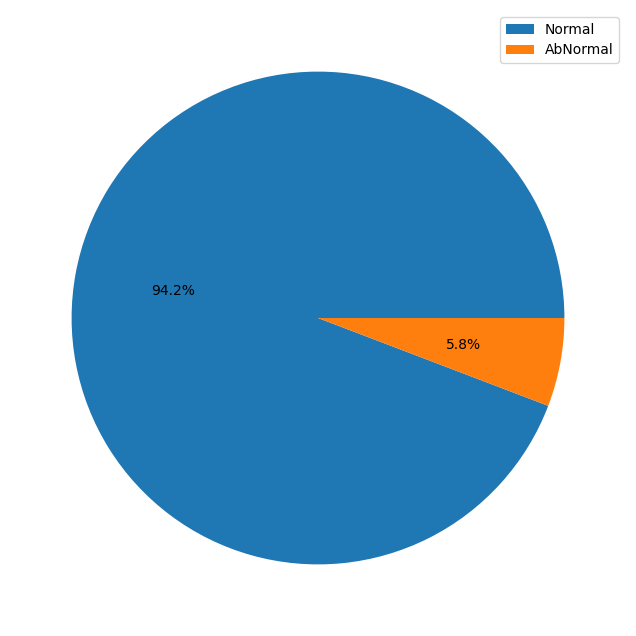

In [15]:
plt.figure(figsize=(8, 8))
labels = ['Normal', 'AbNormal']

plt.pie(
    train_data['target'].value_counts(),
    autopct='%.1f%%'
)

plt.legend(labels)

## 같은 값을 가지는 변수

In [16]:
data = [
    #'Stage1 Circle2 Distance Speed Collect Result_Dam',
    'Stage1 Circle3 Distance Speed Collect Result_Dam', 
    'Stage1 Circle4 Distance Speed Collect Result_Dam', 
    
    #'Stage2 Circle2 Distance Speed Collect Result_Dam', 
    'Stage2 Circle3 Distance Speed Collect Result_Dam', 
    'Stage2 Circle4 Distance Speed Collect Result_Dam', 
    
    #'Stage3 Circle2 Distance Speed Collect Result_Dam', 
    'Stage3 Circle3 Distance Speed Collect Result_Dam', 
    'Stage3 Circle4 Distance Speed Collect Result_Dam',

    #'Model.Suffix_Dam', 
    'Model.Suffix_AutoClave', 
    'Model.Suffix_Fill1', 
    'Model.Suffix_Fill2',
    
    #'Workorder_Dam', 
    'Workorder_AutoClave', 
    'Workorder_Fill1', 
    'Workorder_Fill2'
]

train_data[data]

,Stage1 Circle3 Distance Speed Collect Result_Dam,Stage1 Circle4 Distance Speed Collect Result_Dam,Stage2 Circle3 Distance Speed Collect Result_Dam,Stage2 Circle4 Distance Speed Collect Result_Dam,Stage3 Circle3 Distance Speed Collect Result_Dam,...,Model.Suffix_Fill1,Model.Suffix_Fill2,Workorder_AutoClave,Workorder_Fill1,Workorder_Fill2
0,5800,5800,5300,5300,5800,...,AJX75334505,AJX75334505,4F1XA938-1,4F1XA938-1,4F1XA938-1
1,4000,4000,9000,9000,4000,...,AJX75334505,AJX75334505,3KPM0016-2,3KPM0016-2,3KPM0016-2
2,5800,5800,5300,5300,5800,...,AJX75334501,AJX75334501,4E1X9167-1,4E1X9167-1,4E1X9167-1
3,4000,4000,5000,5000,4000,...,AJX75334501,AJX75334501,3K1X0057-1,3K1X0057-1,3K1X0057-1
4,9000,9000,9000,9000,9000,...,AJX75334501,AJX75334501,3HPM0007-1,3HPM0007-1,3HPM0007-1
...,...,...,...,...,...,...,...,...,...,...,...
40501,5000,5000,9000,9000,5000,...,AJX75334501,AJX75334501,3J1XF434-2,3J1XF434-2,3J1XF434-2
40502,5800,5800,5300,5300,5800,...,AJX75334501,AJX75334501,4E1XC796-1,4E1XC796-1,4E1XC796-1
40503,6000,6000,5500,5500,6000,...,AJX75334501,AJX75334501,4C1XD438-1,4C1XD438-1,4C1XD438-1
40504,9000,9000,9000,9000,9000,...,AJX75334501,AJX75334501,3I1XA258-1,3I1XA258-1,3I1XA258-1


## 고유값을 가지는 변수

In [17]:
unique_counts = train_data.nunique()

single_value_columns = unique_counts[unique_counts == 1].index

print("고유값을 가지는 변수:")
print(f'{len(single_value_columns.tolist())}개')

print("\n고유값을 가지는 변수:")
print(single_value_columns.tolist())

고유값을 가지는 변수:
40개

고유값을 가지는 변수:
['Wip Line_Dam', 'Process Desc._Dam', 'Insp. Seq No._Dam', 'Insp Judge Code_Dam', 'CURE STANDBY POSITION X Collect Result_Dam', 'CURE STANDBY POSITION Z Collect Result_Dam', 'CURE STANDBY POSITION Θ Collect Result_Dam', 'CURE START POSITION Z Collect Result_Dam', 'HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam', 'Wip Line_AutoClave', 'Process Desc._AutoClave', 'Equipment_AutoClave', 'Insp. Seq No._AutoClave', 'Insp Judge Code_AutoClave', '1st Pressure Judge Value_AutoClave', '2nd Pressure Judge Value_AutoClave', '3rd Pressure Judge Value_AutoClave', 'GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave', 'GMES_ORIGIN_INSP_JUDGE_CODE Judge Value_AutoClave', 'Wip Line_Fill1', 'Process Desc._Fill1', 'Insp. Seq No._Fill1', 'Insp Judge Code_Fill1', 'HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill1', 'Wip Line_Fill2', 'Process Desc._Fill2', 'Insp. Seq No._Fill2', 'Insp Judge Code_Fill2', 'CURE END POSITION Θ Collect Result_Fill2', 'CURE STANDBY PO

In [18]:
# drop NaN
train_data = train_data.dropna(axis=1, how='any')

## 수치형 변수

In [19]:
numerical_cols = train_data.select_dtypes(include=np.number).columns.tolist()

print(f"\n수치형 변수 개수: {len(numerical_cols)}")
print(f"\n수치형 변수 목록: {numerical_cols}")


수치형 변수 개수: 149

수치형 변수 목록: ['Insp. Seq No._Dam', 'CURE END POSITION X Collect Result_Dam', 'CURE END POSITION Z Collect Result_Dam', 'CURE END POSITION Θ Collect Result_Dam', 'CURE SPEED Collect Result_Dam', 'CURE STANDBY POSITION X Collect Result_Dam', 'CURE STANDBY POSITION Z Collect Result_Dam', 'CURE STANDBY POSITION Θ Collect Result_Dam', 'CURE START POSITION X Collect Result_Dam', 'CURE START POSITION Z Collect Result_Dam', 'CURE START POSITION Θ Collect Result_Dam', 'DISCHARGED SPEED OF RESIN Collect Result_Dam', 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam', 'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam', 'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam', 'Dispense Volume(Stage1) Collect Result_Dam', 'Dispense Volume(Stage2) Collect Result_Dam', 'Dispense Volume(Stage3) Collect Result_Dam', 'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam', 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Res

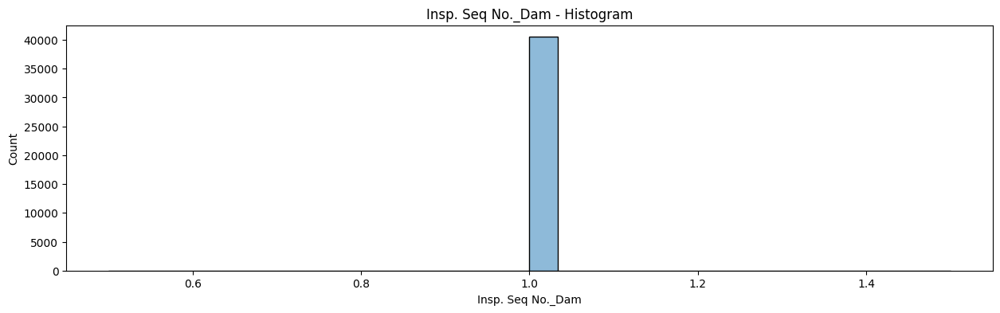

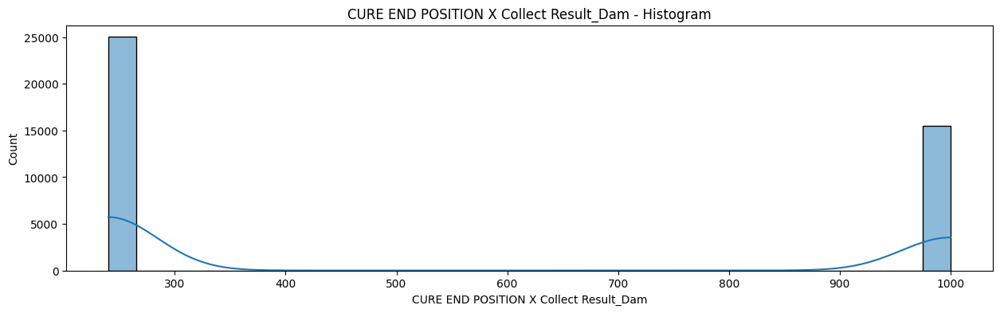

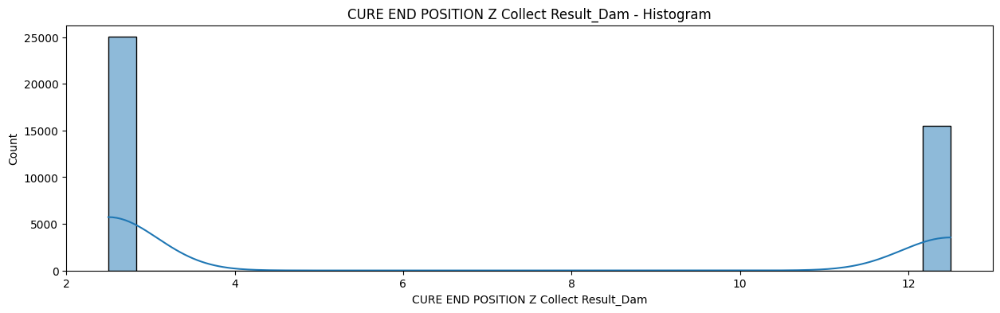

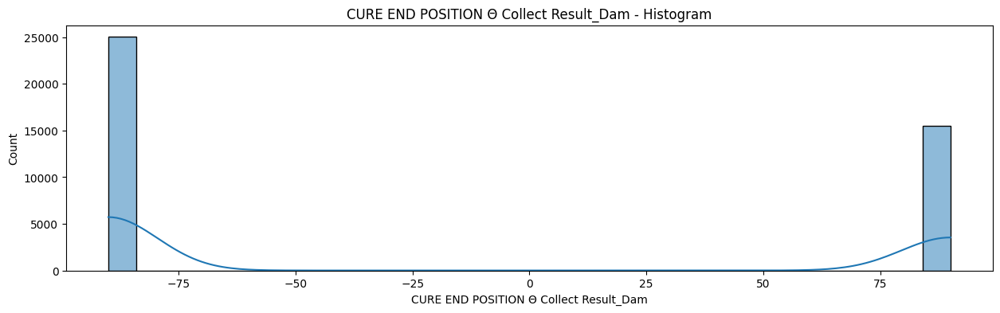

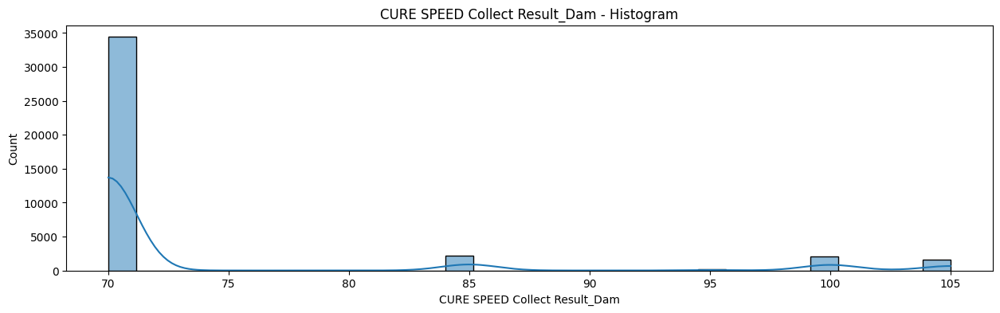

...

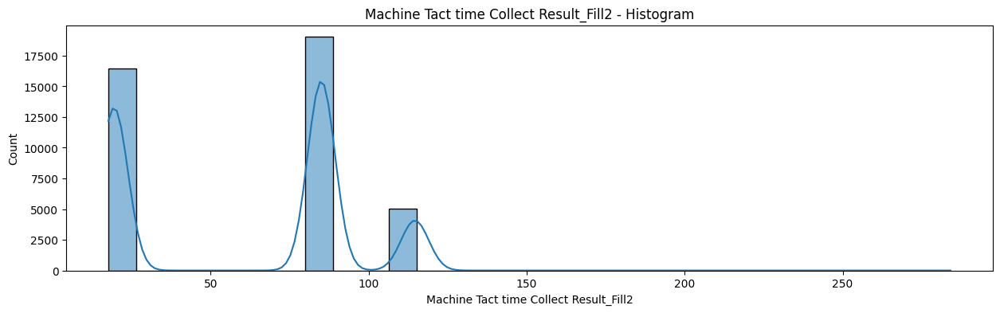

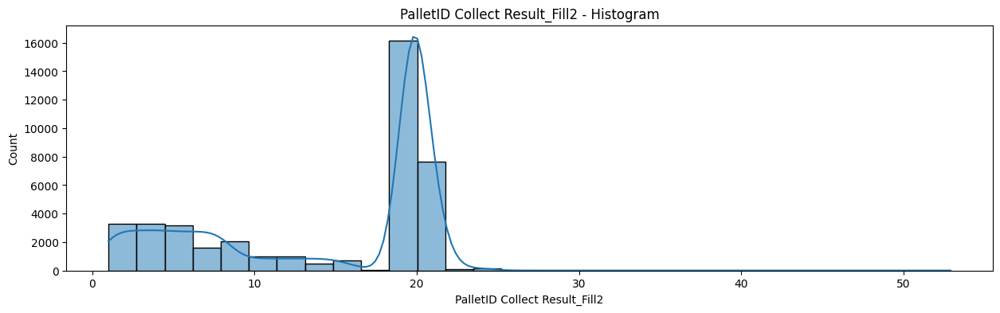

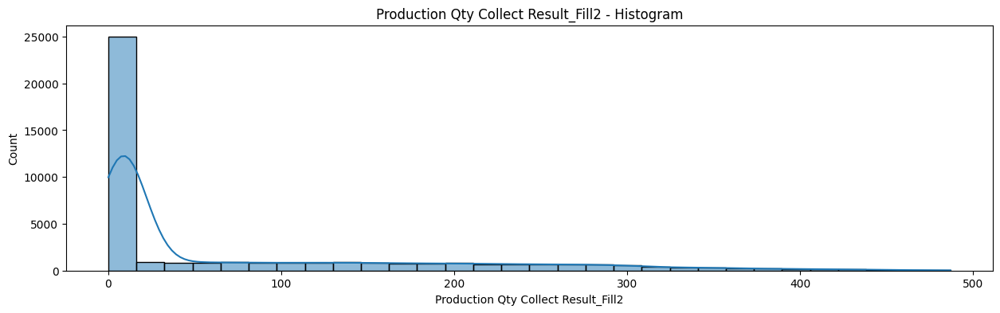

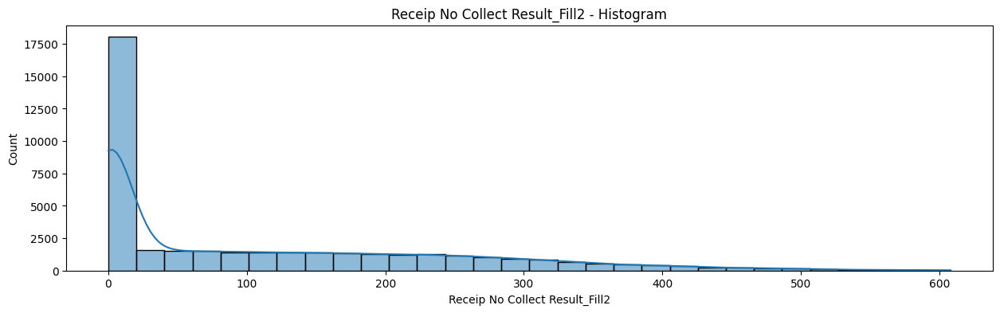

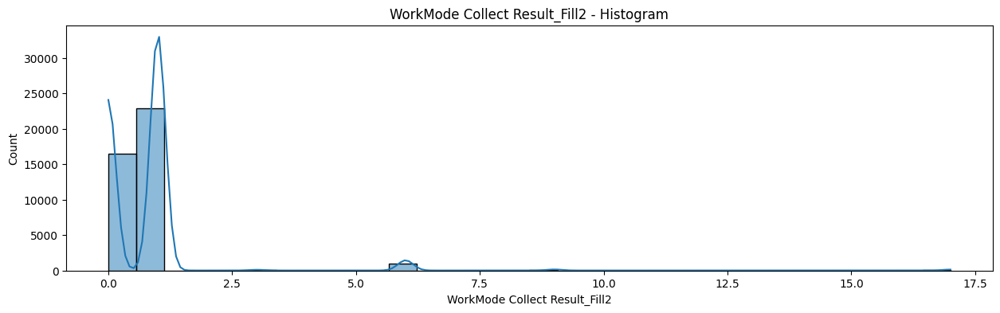

In [20]:
for col in numerical_cols:
    plt.figure(figsize=(15, 4))
    sns.histplot(train_data[col], kde=True, bins=30)
    plt.title(f'{col} - Histogram')
    plt.show()

In [21]:
# 수치형 변수의 고유값 개수
for col in numerical_cols:
    print(f"{col} : {train_data[col].nunique()} unique values")

Insp. Seq No._Dam : 1 unique values
CURE END POSITION X Collect Result_Dam : 2 unique values
CURE END POSITION Z Collect Result_Dam : 2 unique values
CURE END POSITION Θ Collect Result_Dam : 2 unique values
CURE SPEED Collect Result_Dam : 5 unique values
CURE STANDBY POSITION X Collect Result_Dam : 1 unique values
CURE STANDBY POSITION Z Collect Result_Dam : 1 unique values
CURE STANDBY POSITION Θ Collect Result_Dam : 1 unique values
CURE START POSITION X Collect Result_Dam : 2 unique values
CURE START POSITION Z Collect Result_Dam : 1 unique values
CURE START POSITION Θ Collect Result_Dam : 2 unique values
DISCHARGED SPEED OF RESIN Collect Result_Dam : 3 unique values
DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam : 19 unique values
DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam : 29 unique values
DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam : 20 unique values
Dispense Volume(Stage1) Collect Result_Dam : 23 unique values
Dispense Volume(Stage2) Collect Result_Dam : 33

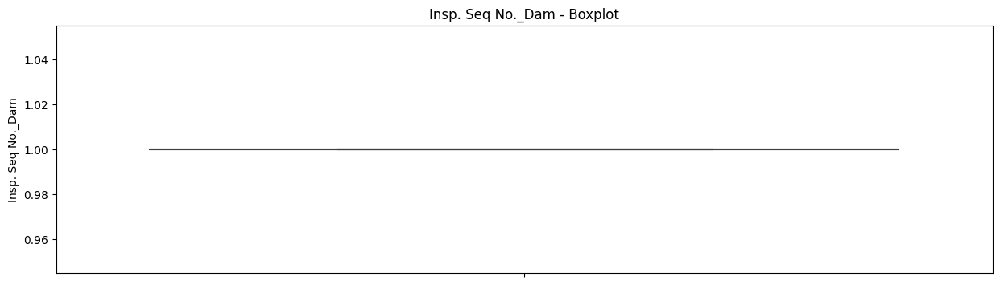

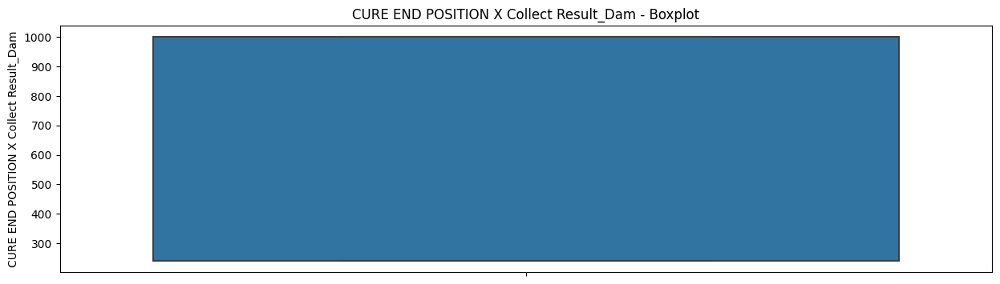

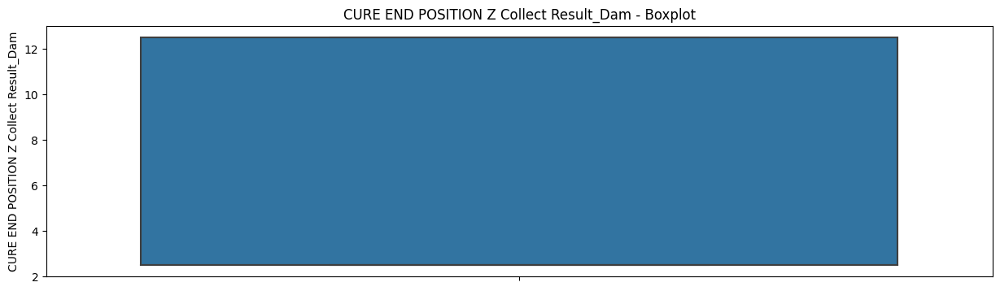

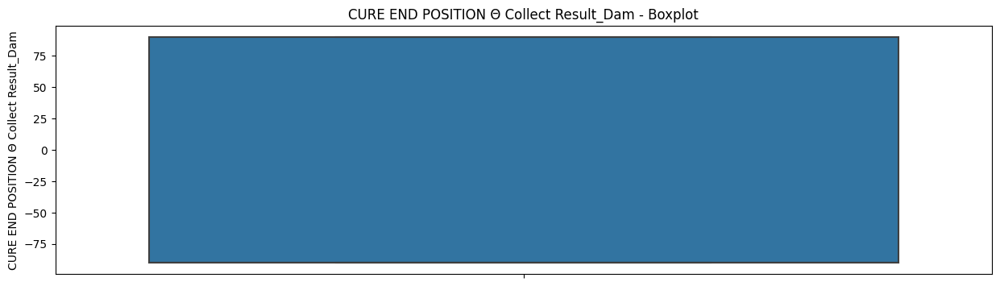

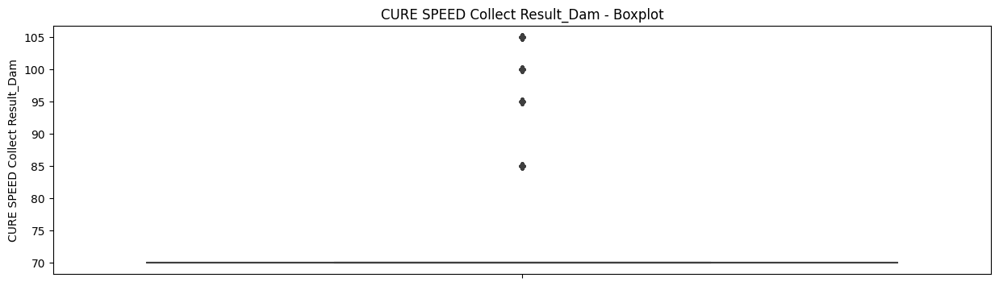

...

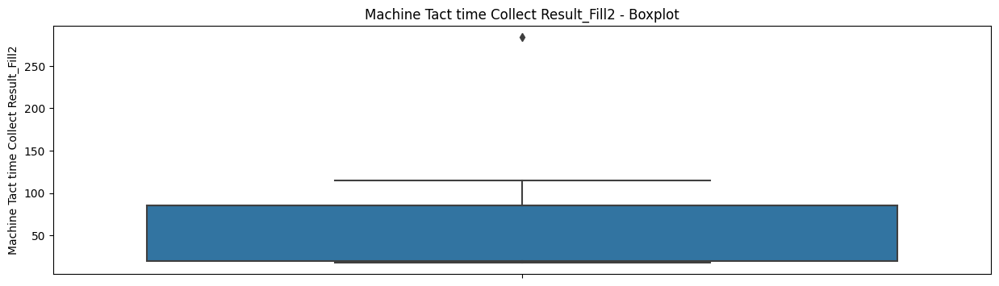

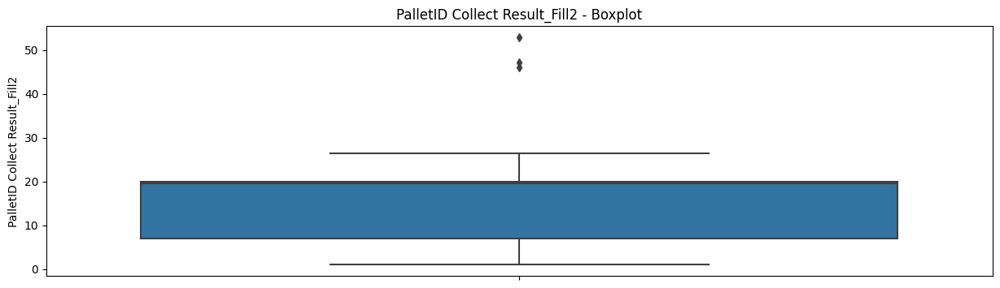

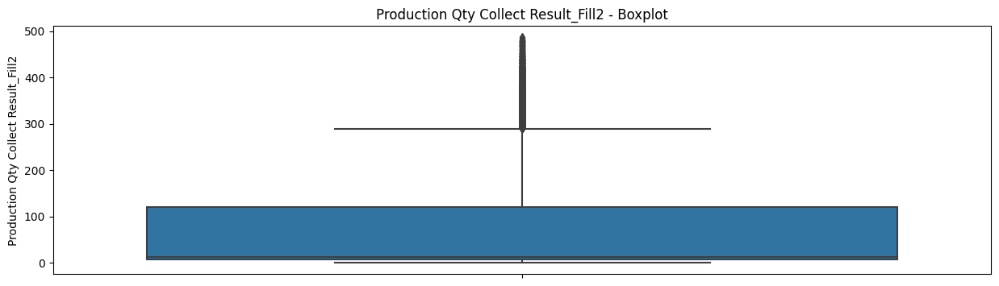

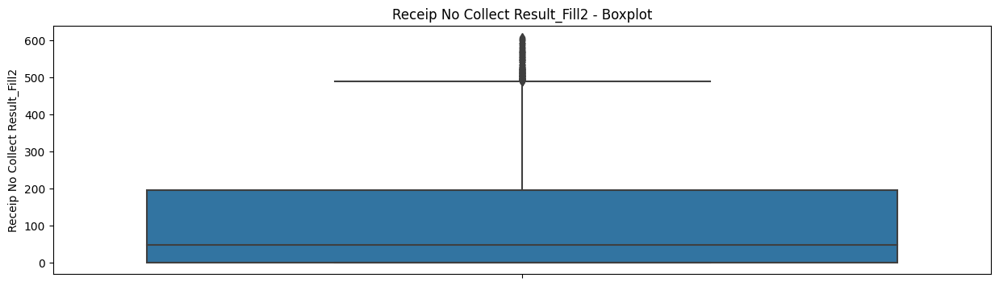

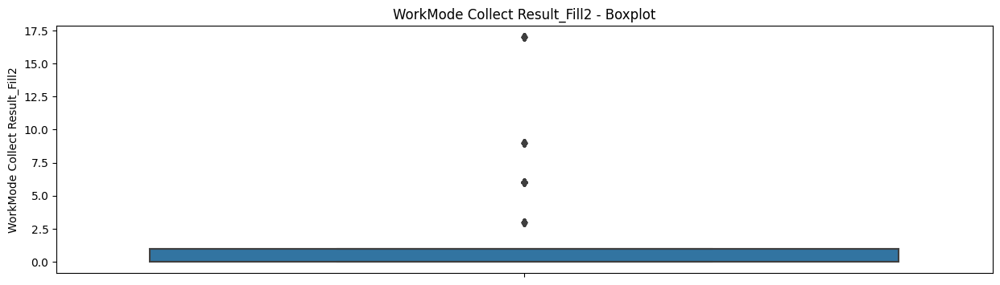

In [22]:
# 수치형 변수의 이상치
for col in numerical_cols:
    plt.figure(figsize=(15, 4))
    sns.boxplot(data=train_data, y=col)
    plt.title(f'{col} - Boxplot')
    plt.show()

## 범주형 변수

In [23]:
categorical_cols = train_data.select_dtypes(include='object').columns.tolist()

print(f"\n범주형 변수 개수: {len(categorical_cols)}")
print(f"\n범주형 변수 목록: {categorical_cols}")


범주형 변수 개수: 29

범주형 변수 목록: ['Wip Line_Dam', 'Process Desc._Dam', 'Equipment_Dam', 'Model.Suffix_Dam', 'Workorder_Dam', 'Insp Judge Code_Dam', 'Wip Line_AutoClave', 'Process Desc._AutoClave', 'Equipment_AutoClave', 'Model.Suffix_AutoClave', 'Workorder_AutoClave', 'Insp Judge Code_AutoClave', '1st Pressure Judge Value_AutoClave', '2nd Pressure Judge Value_AutoClave', '3rd Pressure Judge Value_AutoClave', 'Chamber Temp. Judge Value_AutoClave', 'Wip Line_Fill1', 'Process Desc._Fill1', 'Equipment_Fill1', 'Model.Suffix_Fill1', 'Workorder_Fill1', 'Insp Judge Code_Fill1', 'Wip Line_Fill2', 'Process Desc._Fill2', 'Equipment_Fill2', 'Model.Suffix_Fill2', 'Workorder_Fill2', 'Insp Judge Code_Fill2', 'target']


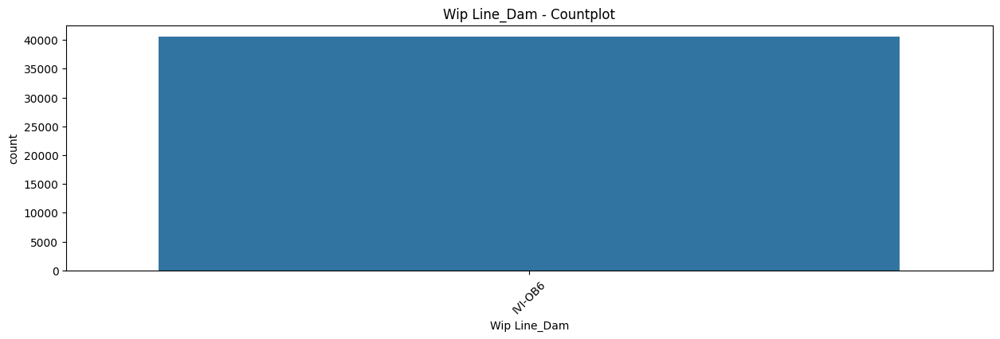

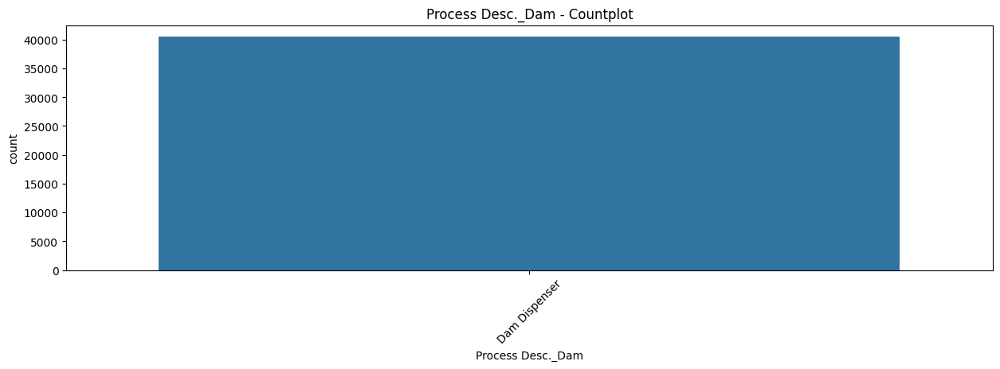

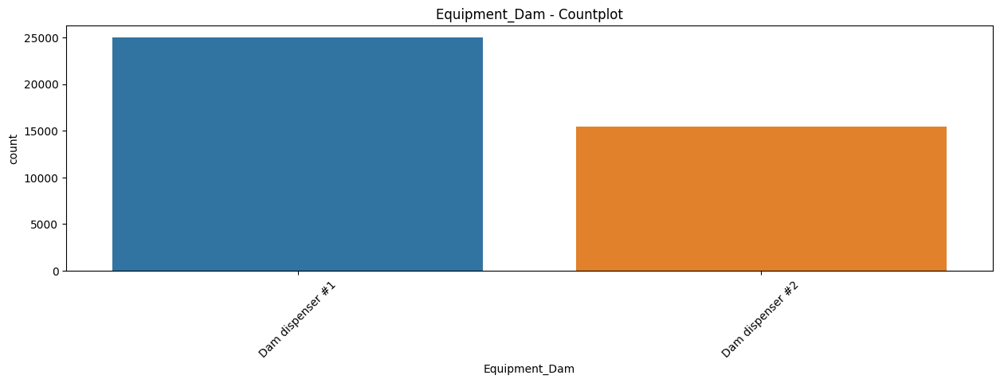

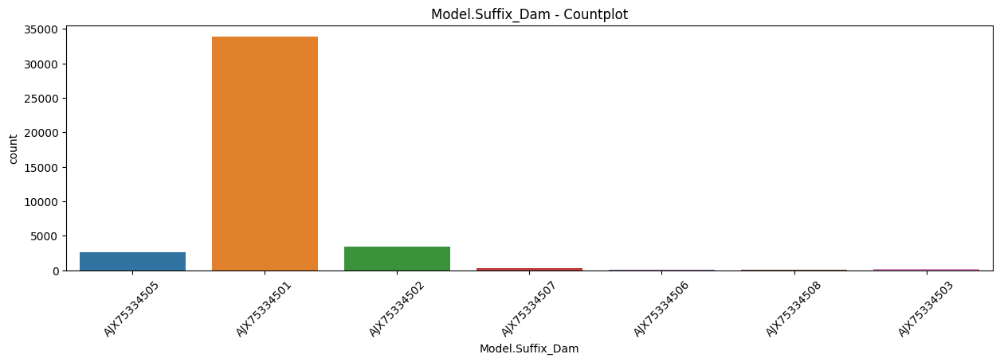

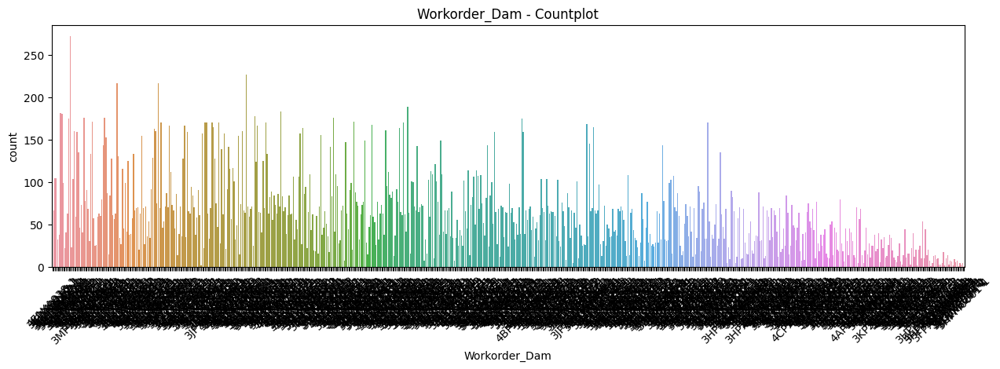

...

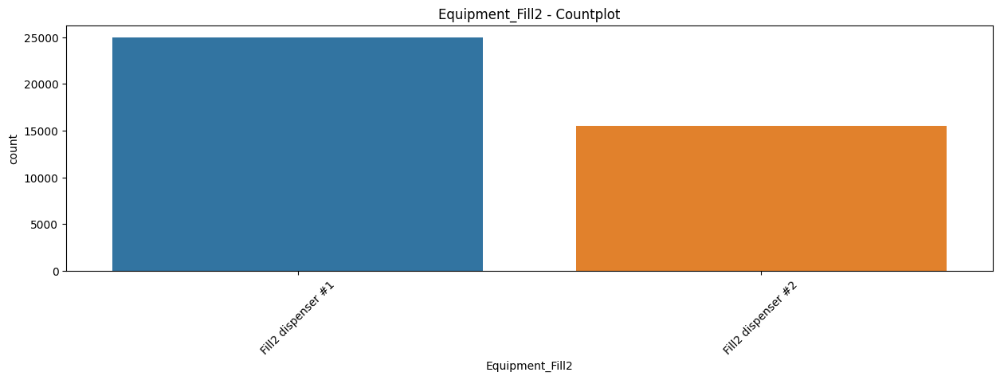

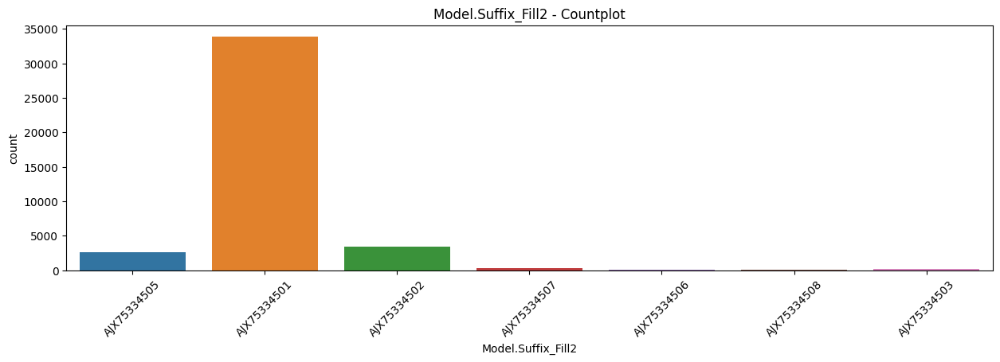

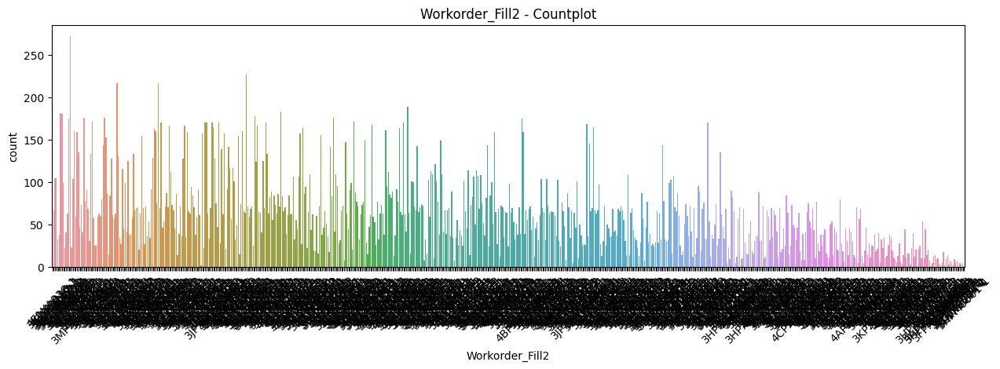

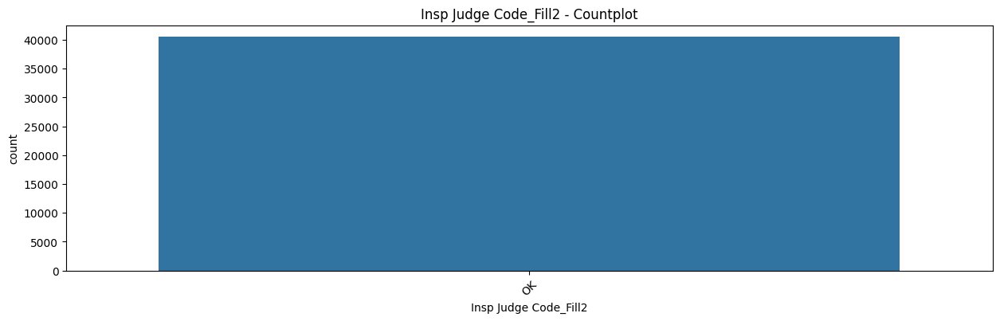

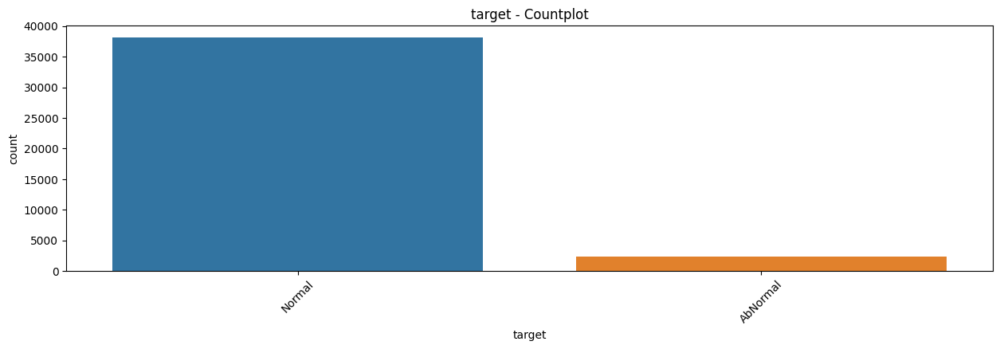

In [24]:
for col in categorical_cols:
    plt.figure(figsize=(15, 4))
    sns.countplot(data=train_data, x=col)
    plt.title(f'{col} - Countplot')
    plt.xticks(rotation=45)
    plt.show()

In [25]:
# 범주형 변수의 고유값 개수
for col in categorical_cols:
    print(f"{col} : {train_data[col].nunique()} unique values")

Wip Line_Dam : 1 unique values
Process Desc._Dam : 1 unique values
Equipment_Dam : 2 unique values
Model.Suffix_Dam : 7 unique values
Workorder_Dam : 663 unique values
Insp Judge Code_Dam : 1 unique values
Wip Line_AutoClave : 1 unique values
Process Desc._AutoClave : 1 unique values
Equipment_AutoClave : 1 unique values
Model.Suffix_AutoClave : 7 unique values
Workorder_AutoClave : 663 unique values
Insp Judge Code_AutoClave : 1 unique values
1st Pressure Judge Value_AutoClave : 1 unique values
2nd Pressure Judge Value_AutoClave : 1 unique values
3rd Pressure Judge Value_AutoClave : 1 unique values
Chamber Temp. Judge Value_AutoClave : 2 unique values
Wip Line_Fill1 : 1 unique values
Process Desc._Fill1 : 1 unique values
Equipment_Fill1 : 2 unique values
Model.Suffix_Fill1 : 7 unique values
Workorder_Fill1 : 663 unique values
Insp Judge Code_Fill1 : 1 unique values
Wip Line_Fill2 : 1 unique values
Process Desc._Fill2 : 1 unique values
Equipment_Fill2 : 2 unique values
Model.Suffix_Fil

In [26]:
train_data = train_data.drop(columns=train_data.columns[train_data.nunique() == 1])

In [27]:
# 중복 변수 제거
columns_to_drop = [
    #'Stage1 Circle2 Distance Speed Collect Result_Dam',
    'Stage1 Circle3 Distance Speed Collect Result_Dam', 
    'Stage1 Circle4 Distance Speed Collect Result_Dam', 
    
    #'Stage2 Circle2 Distance Speed Collect Result_Dam', 
    'Stage2 Circle3 Distance Speed Collect Result_Dam', 
    'Stage2 Circle4 Distance Speed Collect Result_Dam', 
    
    #'Stage3 Circle2 Distance Speed Collect Result_Dam', 
    'Stage3 Circle3 Distance Speed Collect Result_Dam', 
    'Stage3 Circle4 Distance Speed Collect Result_Dam',

    #'Model.Suffix_Dam', 
    'Model.Suffix_AutoClave', 
    'Model.Suffix_Fill1', 
    'Model.Suffix_Fill2',
    
    #'Workorder_Dam', 
    'Workorder_AutoClave', 
    'Workorder_Fill1', 
    'Workorder_Fill2'
]

train_data = train_data.drop(columns=columns_to_drop)

In [28]:
# 수치형 변수 재정의
numerical_cols = train_data.select_dtypes(include=np.number).columns.tolist()

print(f"\n수치형 변수 개수: {len(numerical_cols)}")
print(f"\n수치형 변수 목록: {numerical_cols}")


수치형 변수 개수: 124

수치형 변수 목록: ['CURE END POSITION X Collect Result_Dam', 'CURE END POSITION Z Collect Result_Dam', 'CURE END POSITION Θ Collect Result_Dam', 'CURE SPEED Collect Result_Dam', 'CURE START POSITION X Collect Result_Dam', 'CURE START POSITION Θ Collect Result_Dam', 'DISCHARGED SPEED OF RESIN Collect Result_Dam', 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam', 'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam', 'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam', 'Dispense Volume(Stage1) Collect Result_Dam', 'Dispense Volume(Stage2) Collect Result_Dam', 'Dispense Volume(Stage3) Collect Result_Dam', 'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam', 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL 

In [29]:
# 수치형 변수 재정의
categorical_cols = train_data.select_dtypes(include='object').columns.tolist()

print(f"\n범주형 변수 개수: {len(categorical_cols)}")
print(f"\n범주형 변수 목록: {categorical_cols}")


범주형 변수 개수: 7

범주형 변수 목록: ['Equipment_Dam', 'Model.Suffix_Dam', 'Workorder_Dam', 'Chamber Temp. Judge Value_AutoClave', 'Equipment_Fill1', 'Equipment_Fill2', 'target']


## target과의 관계

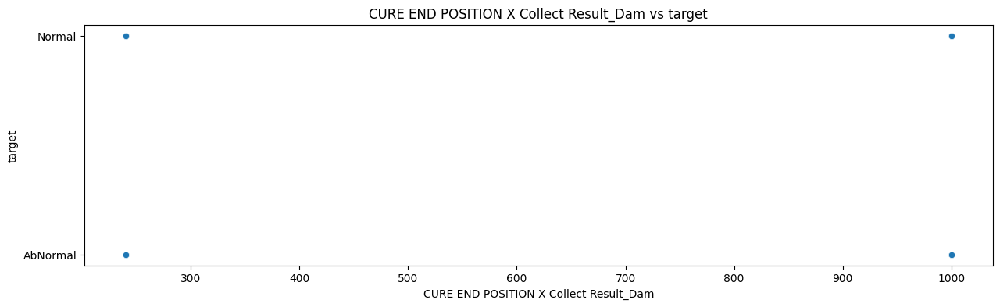

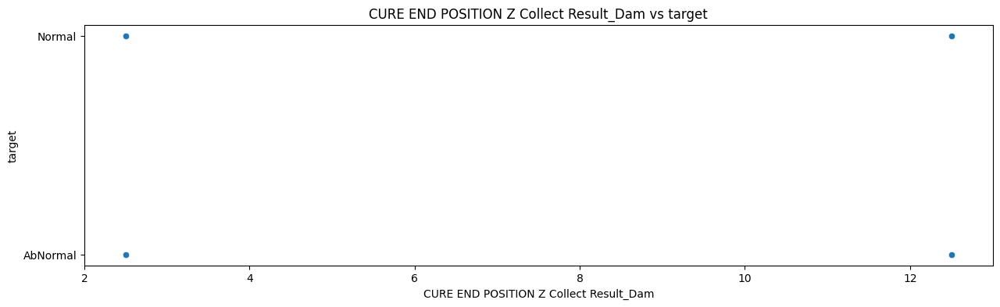

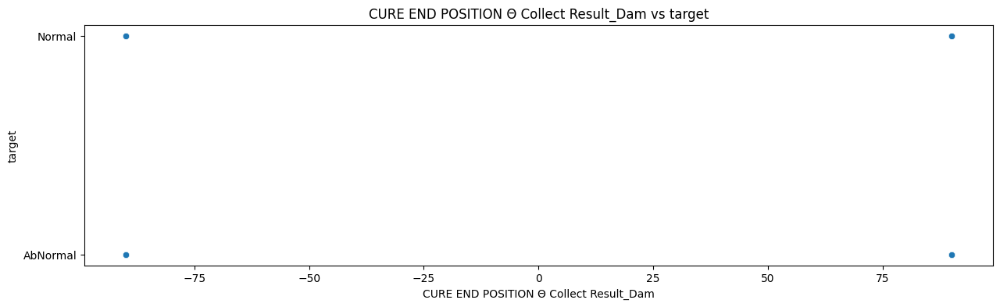

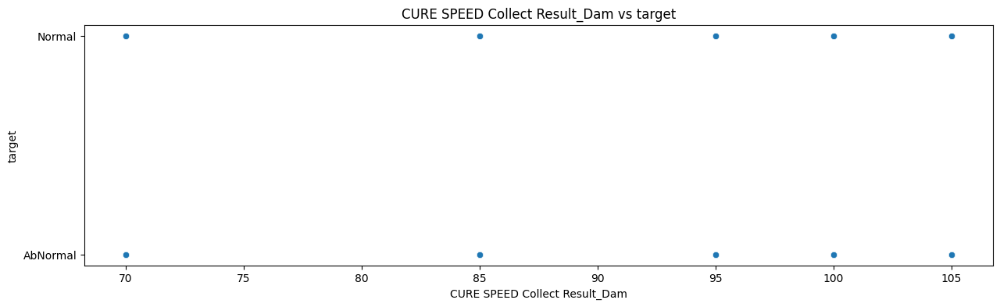

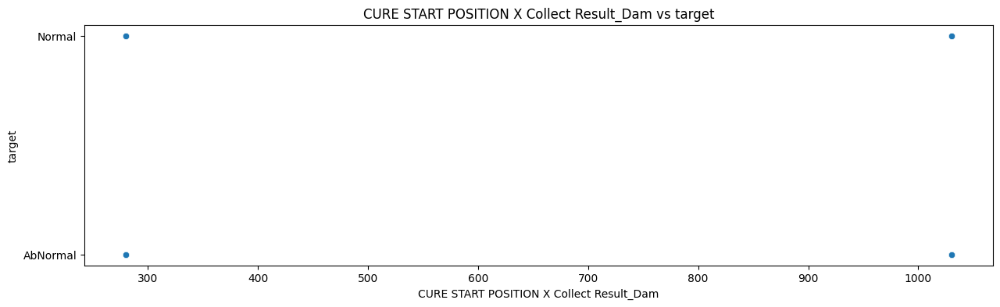

...

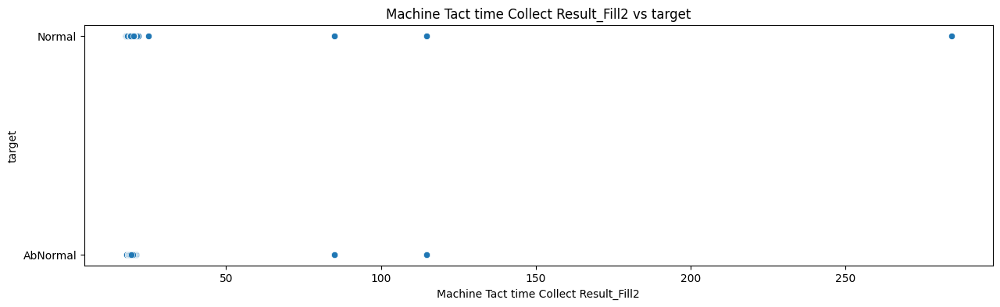

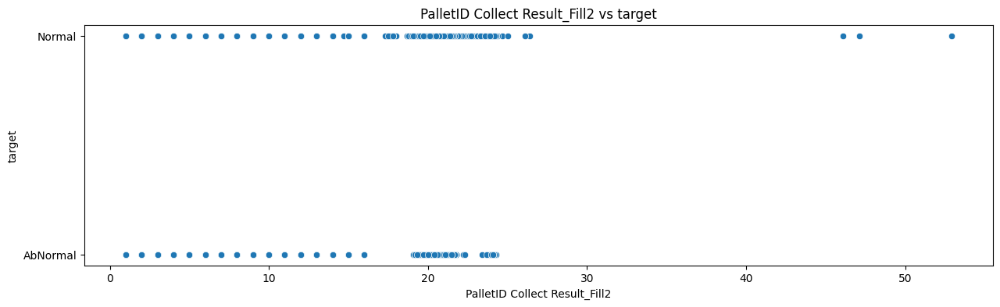

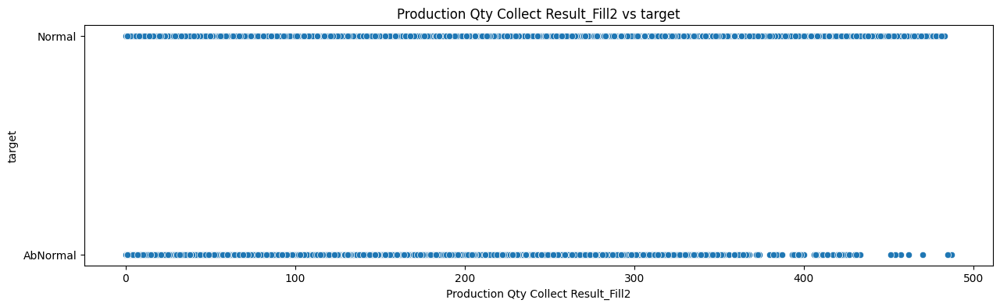

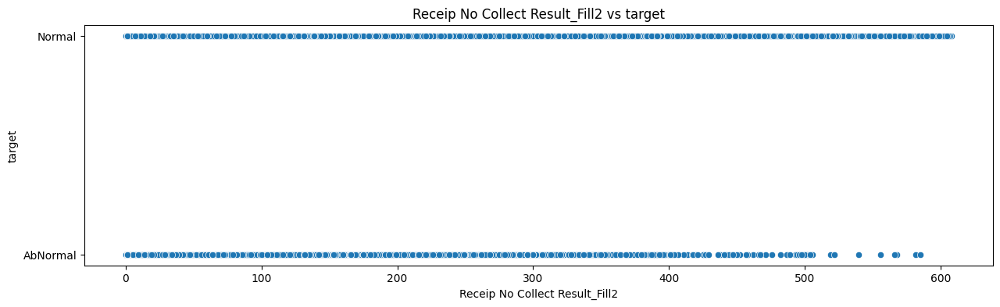

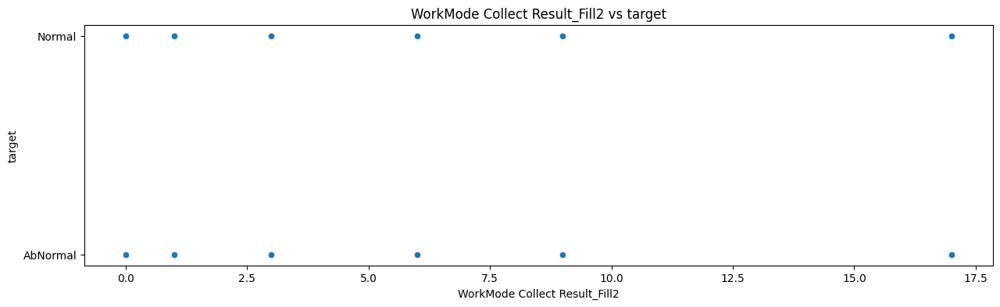

In [30]:
# 수치형
target = 'target'
for col in numerical_cols:
    if col != target:
        plt.figure(figsize=(15, 4))
        sns.scatterplot(data=train_data, x=col, y=target)
        plt.title(f'{col} vs {target}')
        plt.show()

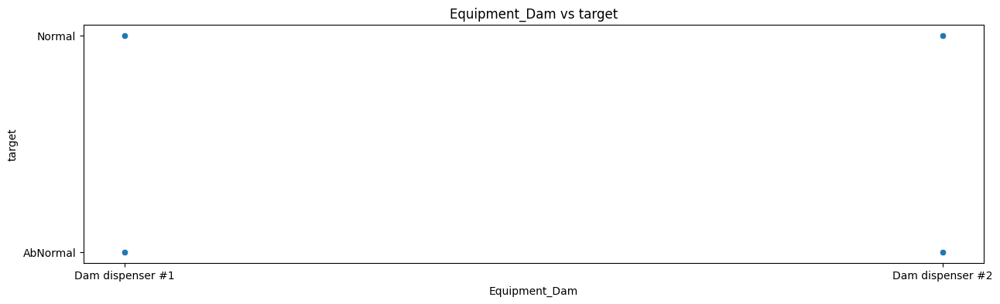

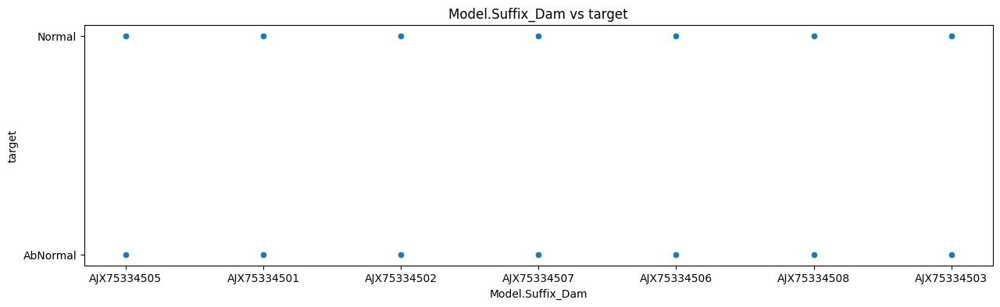

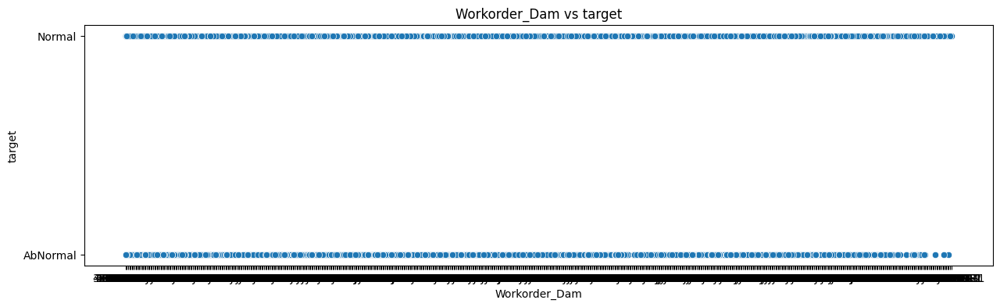

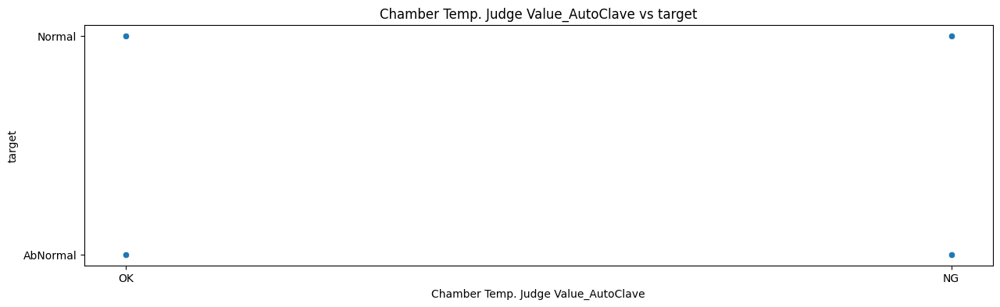

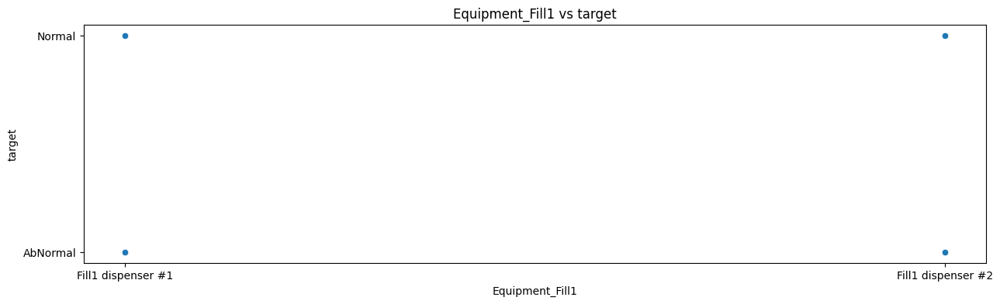

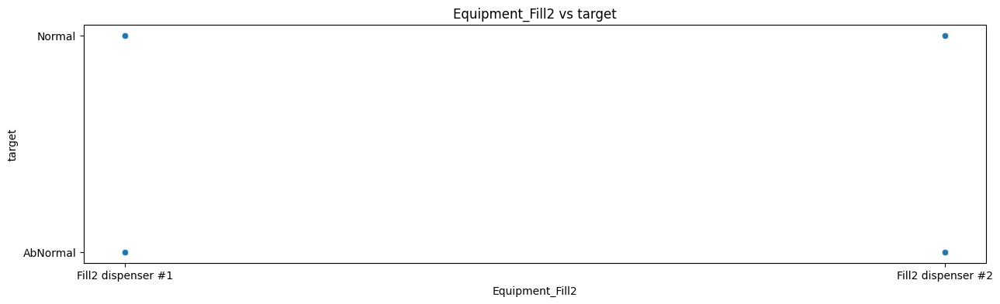

In [31]:
# 범주형
target = 'target'
for col in categorical_cols:
    if col != target:
        plt.figure(figsize=(15, 4))
        sns.scatterplot(data=train_data, x=col, y=target)
        plt.title(f'{col} vs {target}')
        plt.show()